# Ranking Ventral Activity of Odorant CSVs

A notebook for ranking the ventral activity of odorant stimuli given by data in CSV files.

Import all the necessary packages

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

%matplotlib inline

Get a list of all available CSVs

In [2]:
p = Path('.')
all_csvs = list(p.glob('csvs/*.csv'))

Create a list of CSVs with their corresponding level of activity in midsection of images relative to the mean value of the image

In [3]:
data = []

for file in all_csvs:
    df = pd.read_csv(file, index_col=None, header=0)
    
    total_avg = df.mean(axis='columns').mean(axis='index')
    mid_avg = df[20:60].mean(axis='columns').mean(axis='index')
    activity_val = mid_avg - total_avg
    
    data.append({'file': file, 'activity': activity_val})

Create a DataFrame from previously constructed list and sort by midsection activity (lowest to highest)

In [4]:
rankings = pd.DataFrame(data, columns=['file', 'activity'])
ranked_df = rankings.sort_values(by='activity')
print(ranked_df)

                                    file  activity
261                csvs/eucalyptol_2.csv -0.590650
238      csvs/2,3-dimethylpyrazine_0.csv -0.504581
151      csvs/4-tert-butylpyridine_0.csv -0.504304
105         csvs/methyl salicylate_7.csv -0.498135
94                 csvs/eucalyptol_1.csv -0.493614
..                                   ...       ...
5                     csvs/decanal_2.csv  0.342194
48                 csvs/2-decanone_2.csv  0.343326
86           csvs/methyl octanoate_0.csv  0.397049
65                    csvs/nonanal_0.csv  0.405825
398  csvs/methyl trans-2-octenoate_0.csv  0.411893

[432 rows x 2 columns]


The DataFrame is then split into multiple lists for easier plotting and visualization

In [5]:
ranked_csvs = ranked_df['file']
ranked_split = [ranked_csvs[x:x+54] for x in range(0, len(ranked_csvs), 54)]

The list is then iterated through and plotted below

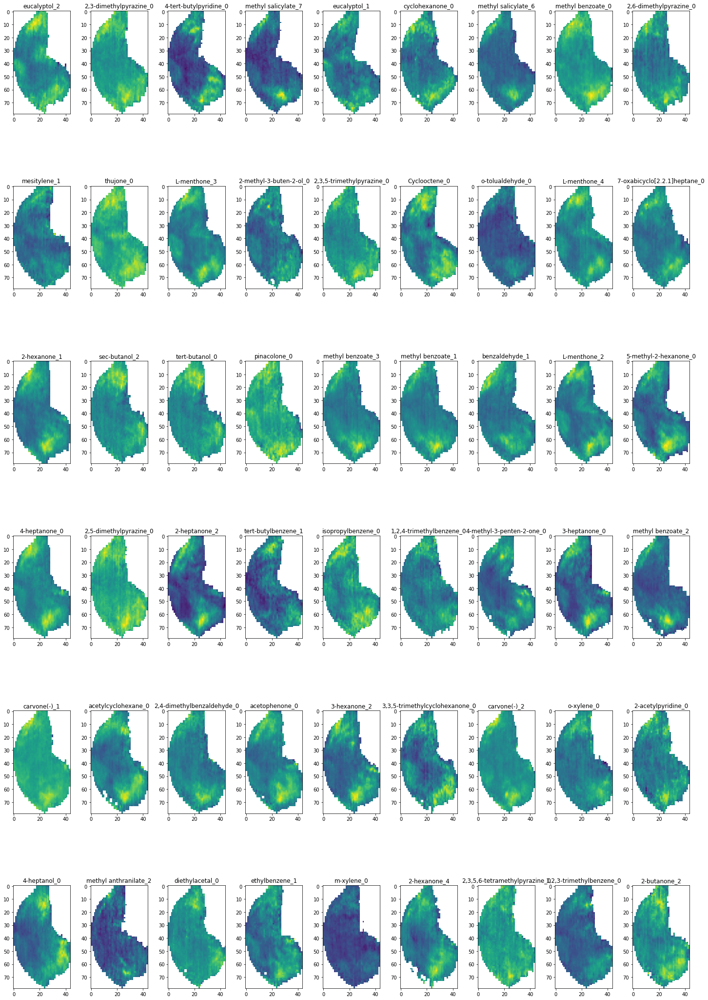

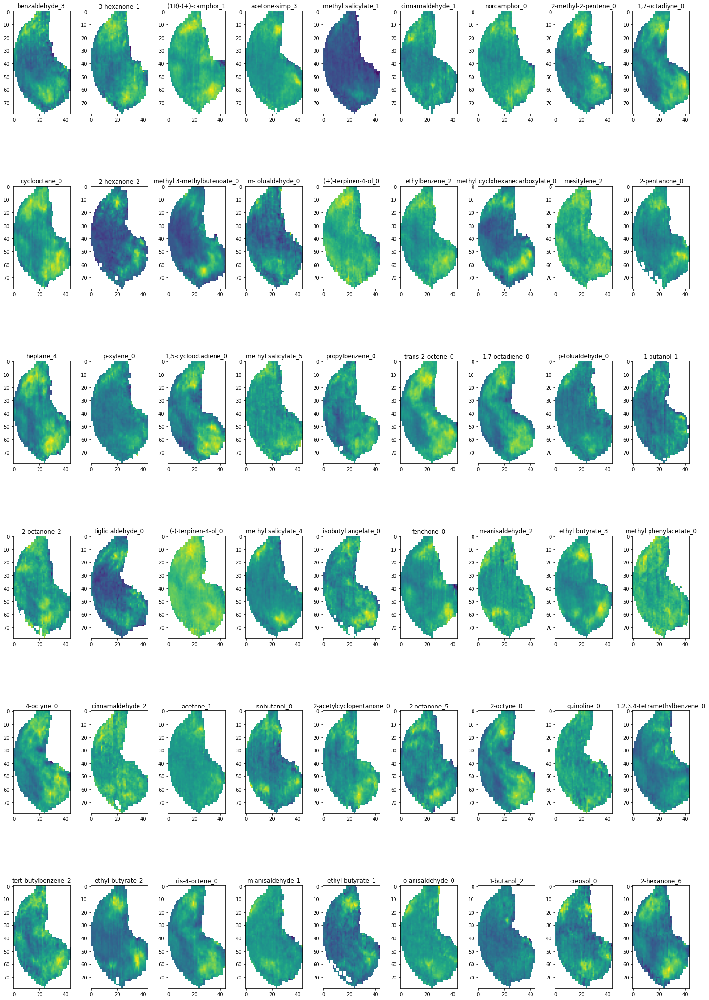

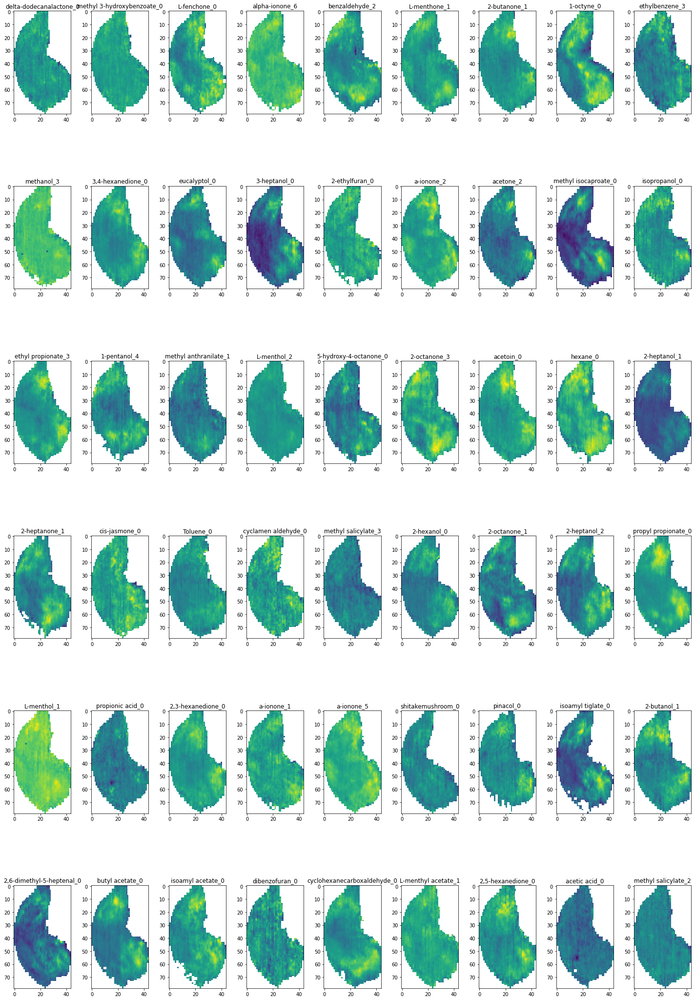

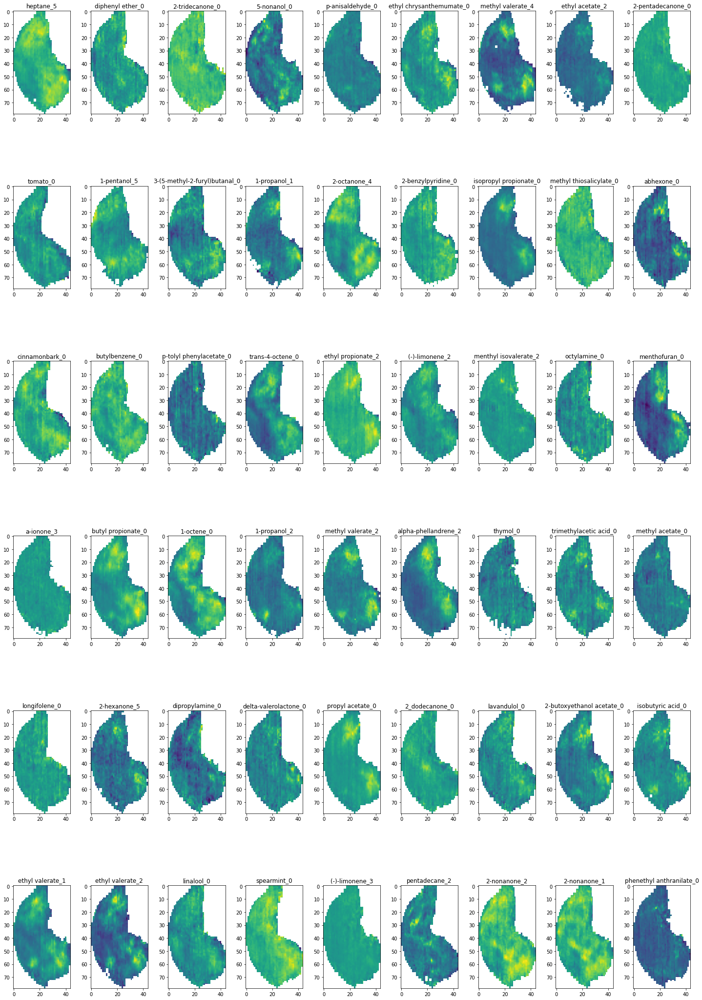

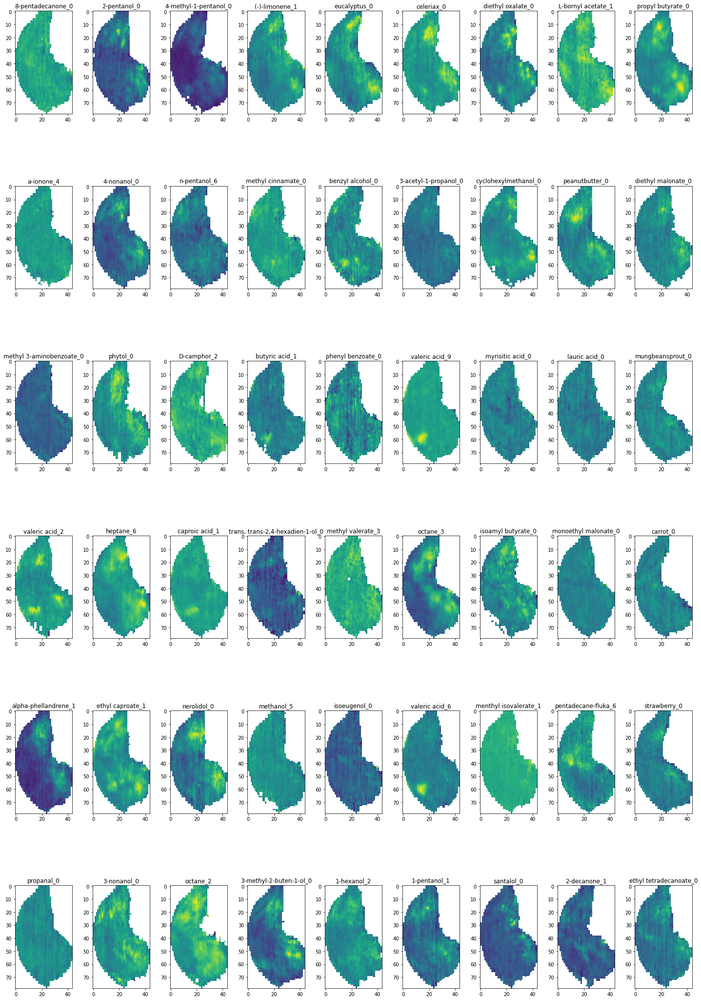

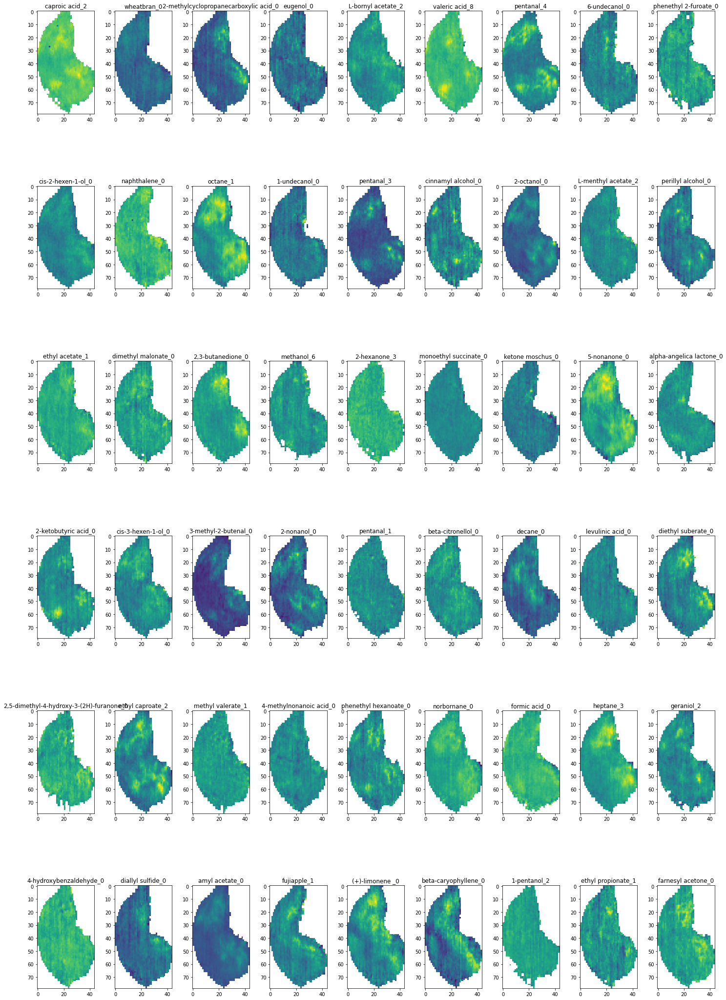

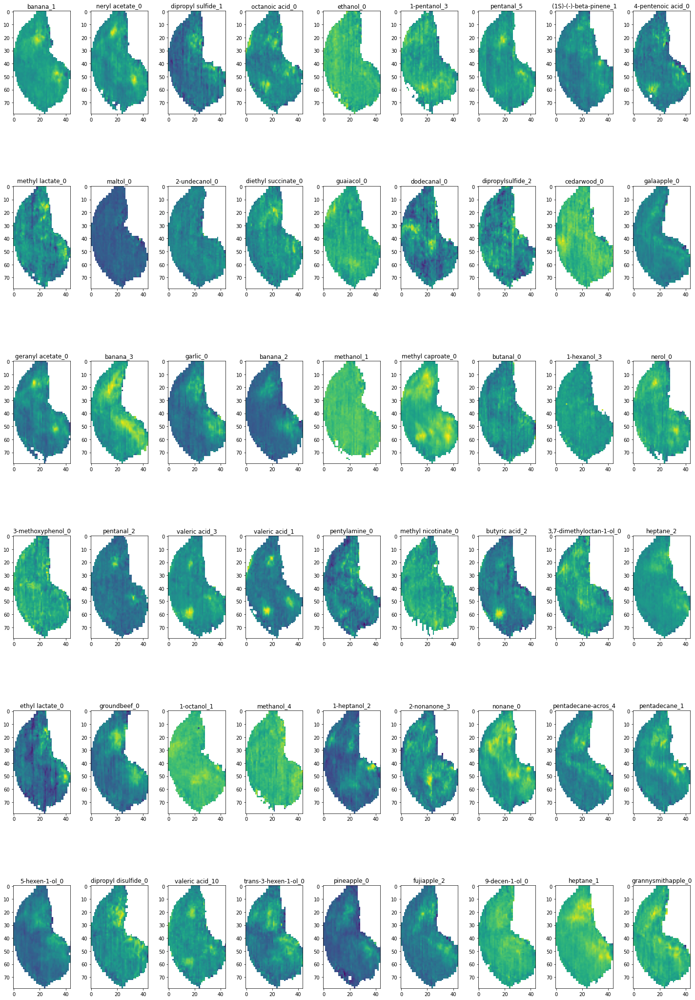

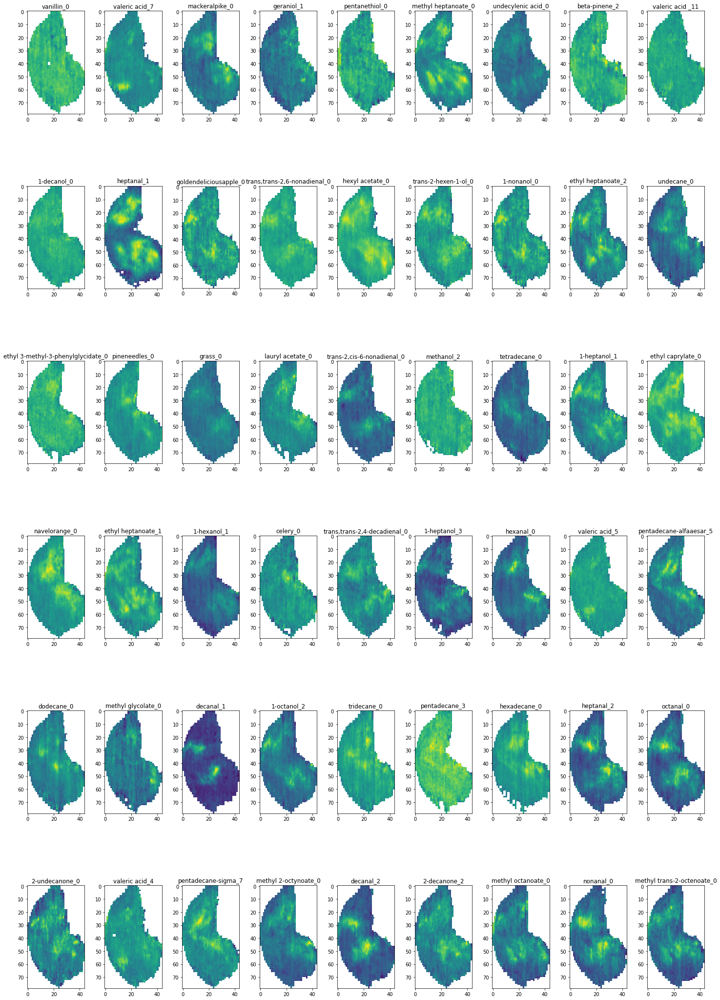

In [7]:
for csvs in ranked_split:
    fig, ax = plt.subplots(6, 9, figsize=(20,30))
    fig.tight_layout()
    ax = ax.ravel()
    
    for ax_id, file in enumerate(csvs):
        df = pd.read_csv(file, index_col=None, header=0)
        ax[ax_id].set_title(Path(file).stem)
        ax[ax_id].imshow(df)